In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import datetime
import geopy.distance as geo
import json
import time
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
warnings.filterwarnings(action="ignore")
%matplotlib inline

In [4]:
df = pd.read_csv('../input/availability.csv')

- What is effect of weekday vs weekend? Mon-Wed vs Thu/Fri?
- Which boroughs run out of bikes at what hours? 
- What is effect of rain on bike availability? 

Notes:
- Does rain effect morning riders differently from evening riders? 
- Do previous days of rain/sun affect ridership?
- Month of May has variety of weather conditions
- What are problem hours? 
- Should we calculate relative bike availability? As in, difference at 9am vs 4am?
- Arrival/departure stations
- Dissect individual hours / hoods
- What hoods/boroughs are bikes moving from/to?
- How to use facetgrid to show day/time/availability/weather

In [66]:
df['time_float'] = df['time_interval'].apply(lambda x: int(x.split(' ')[1].split(':')[0]) + int(x.split(' ')[1].split(':')[1])/60)                                       
df['time_int'] = df['time_float'].apply(lambda x: int(x))
df['day'] = df['time_interval'].apply(lambda x: datetime.datetime(int(x.split(' ')[0].split('-')[0]),int(x.split(' ')[0].split('-')[1]), int(x.split(' ')[0].split('-')[2])).weekday())
df['day_name'] = df['time_interval'].apply(lambda x: datetime.datetime(int(x.split(' ')[0].split('-')[0]),int(x.split(' ')[0].split('-')[1]), int(x.split(' ')[0].split('-')[2])).strftime("%A"))
df['month_day'] = df['time_interval'].apply(lambda x: datetime.datetime(int(x.split(' ')[0].split('-')[0]),int(x.split(' ')[0].split('-')[1]), int(x.split(' ')[0].split('-')[2])).strftime('%Y-%m-%d'))
df['is_weekday'] = df['day'].apply(lambda x: int(x < 5))
df['month_day_name'] = df['month_day'] + ' ' + df['day_name']
df['is_raining'] = df['precip_intensity'] > 0
df['is_cold'] = df['temperature'] < 55
# df_weekdays_daytime = df[(df['is_weekday'] == 1) & (df['time_int'] < 22) & (df['time_int'] > 5) ]
# df_daytime = df[(df['time_int'] < 22) & (df['time_int'] > 5) ]
                                             

In [69]:
df.sample(5)

,station_id,station_name,station_status,latitude,longitude,zip,borough,hood,available_bikes,available_docks,...,updated_at,time_float,time_int,day,day_name,month_day,is_weekday,month_day_name,is_raining,is_cold
365874,3088,Union Ave & Jackson St,In Service,40.716075,-73.952029,11211,Brooklyn,Williamsburg,8,11,...,2019-05-12 22:45:28,20.50,20,6,Sunday,2019-05-12,0,2019-05-12 Sunday,False,True
644299,3402,Court St & State St,In Service,40.690238,-73.992031,11201,Brooklyn,Downtown Brooklyn,2,21,...,2019-05-12 12:47:25,1.25,1,4,Friday,2019-05-03,1,2019-05-03 Friday,False,True
553108,3314,W 95 St & Broadway,In Service,40.793770,-73.971888,10025,Manhattan,UWS,0,32,...,2019-05-12 12:04:02,11.25,11,1,Tuesday,2019-05-07,1,2019-05-07 Tuesday,False,False
896744,3708,W 13 St & 5 Ave,In Service,40.735445,-73.994310,10011,Manhattan,Greenwich Village,8,20,...,2019-05-12 12:04:02,12.25,12,6,Sunday,2019-05-05,0,2019-05-05 Sunday,True,False
785367,3568,34 St & 35 Ave,In Service,40.756933,-73.926223,11106,Queens,Astoria,1,20,...,2019-05-12 13:24:27,17.50,17,5,Saturday,2019-05-11,0,2019-05-11 Saturday,False,False


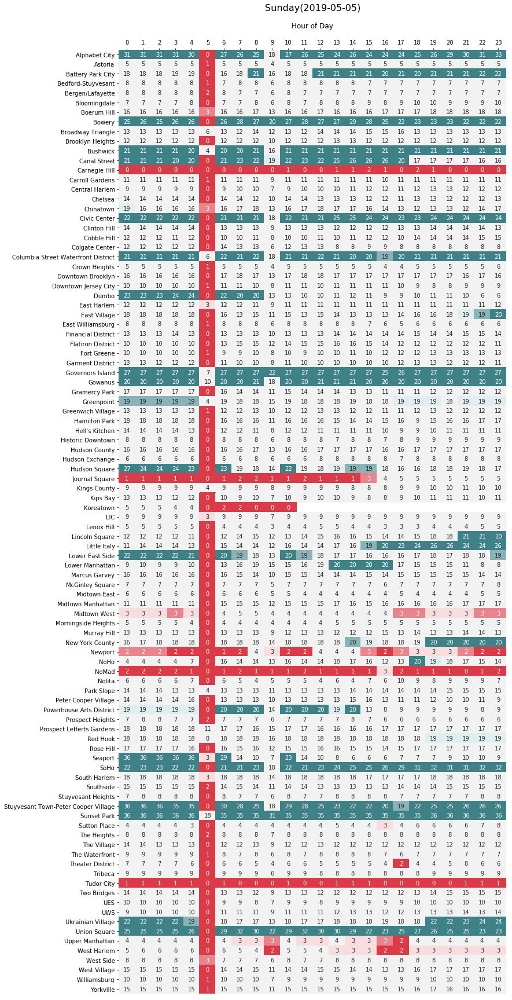

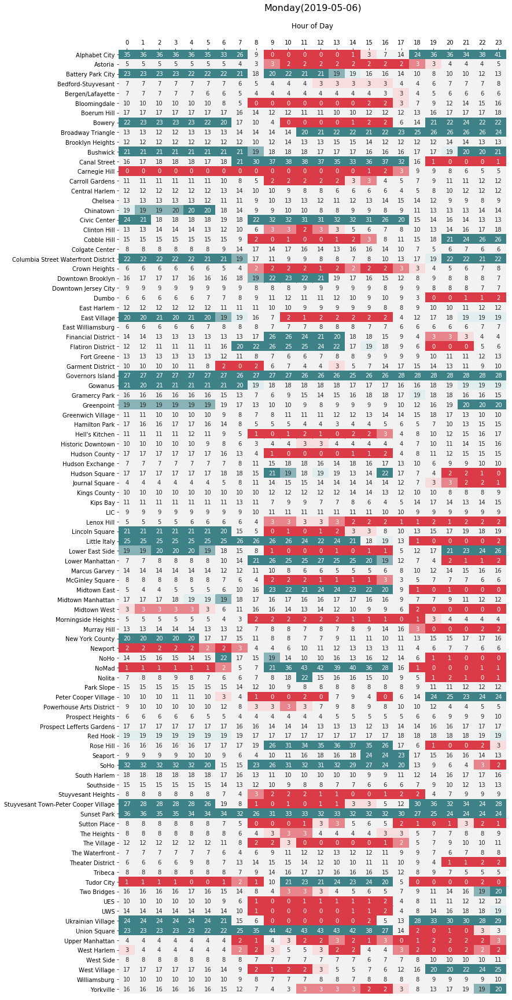

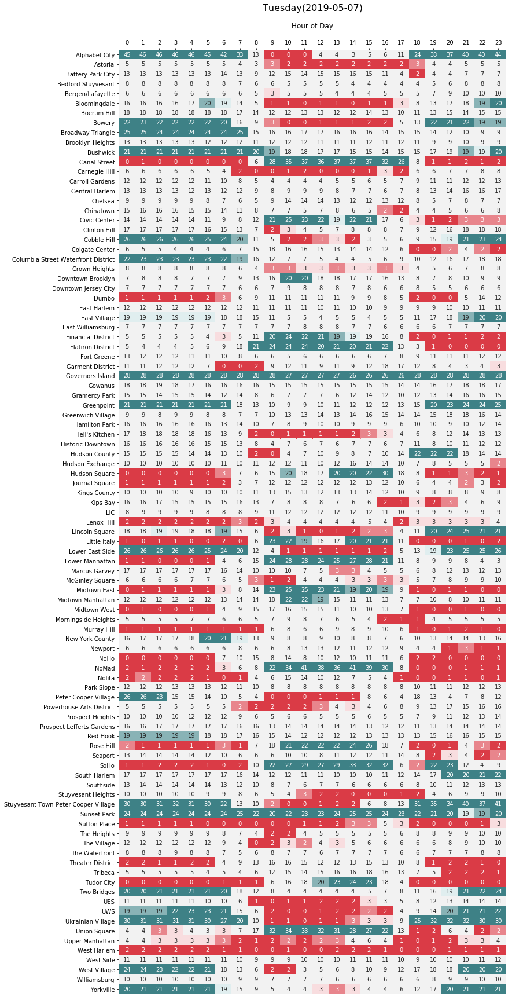

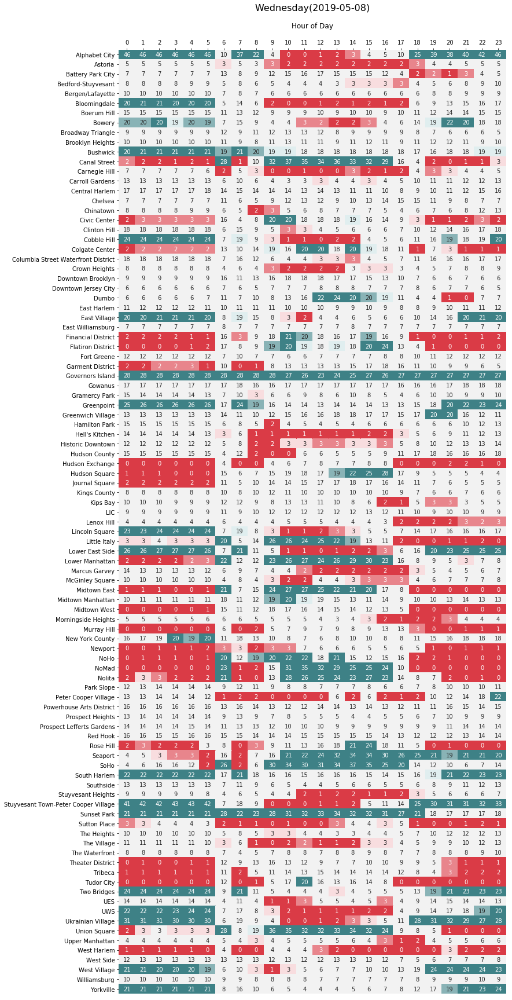

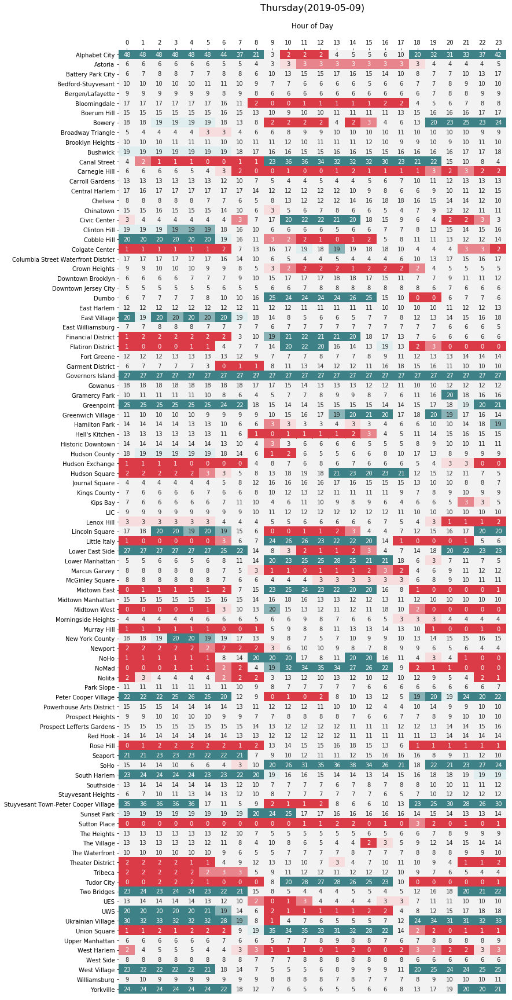

...

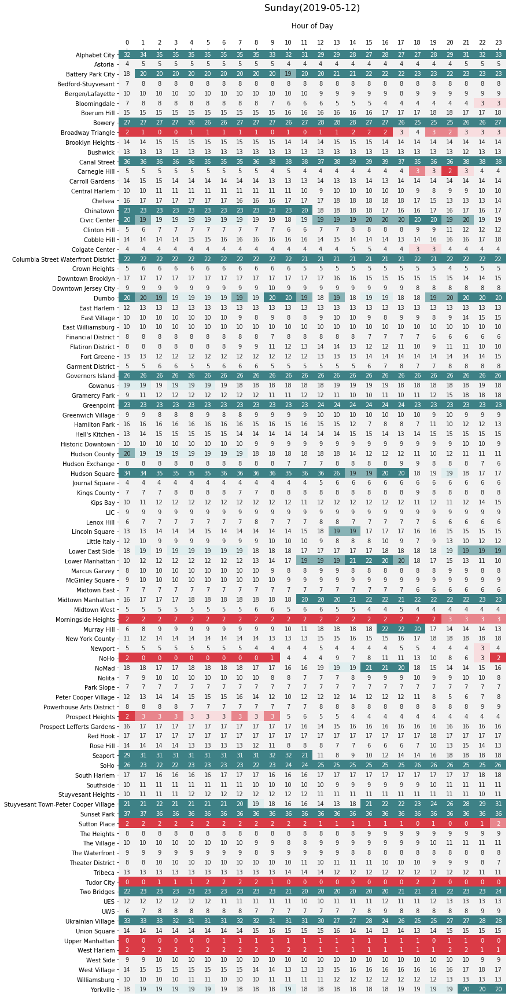

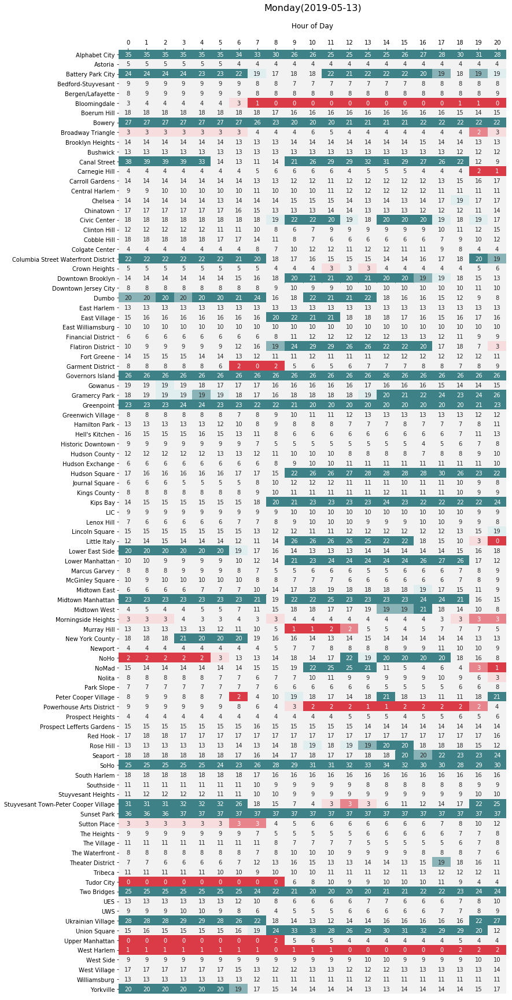

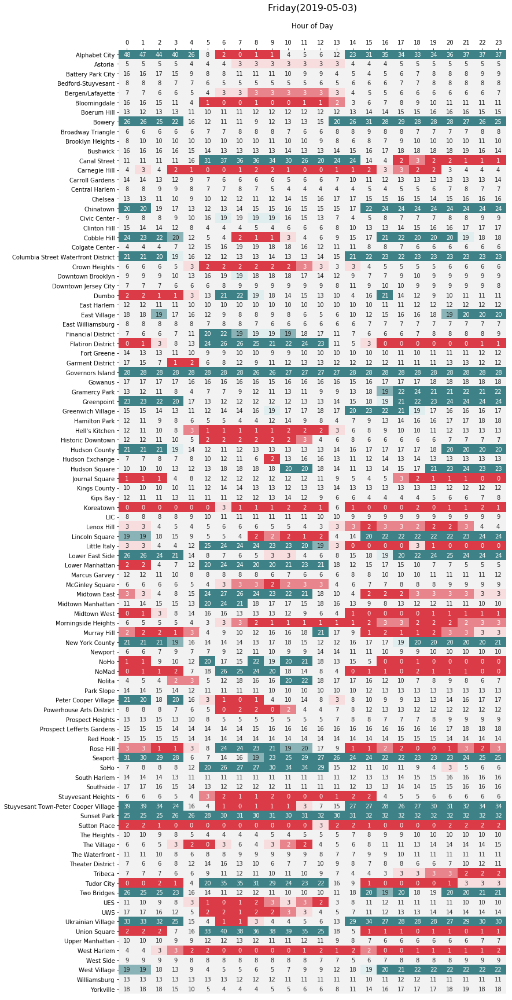

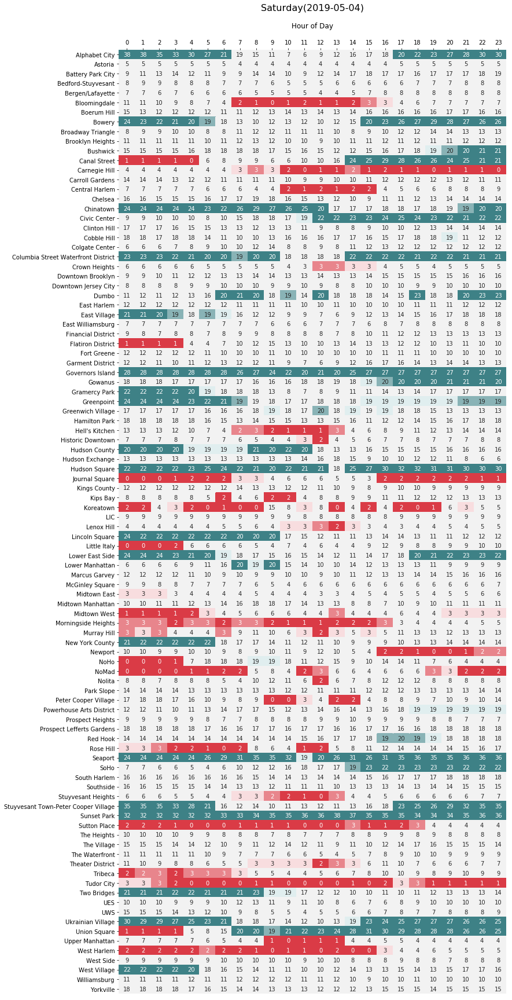

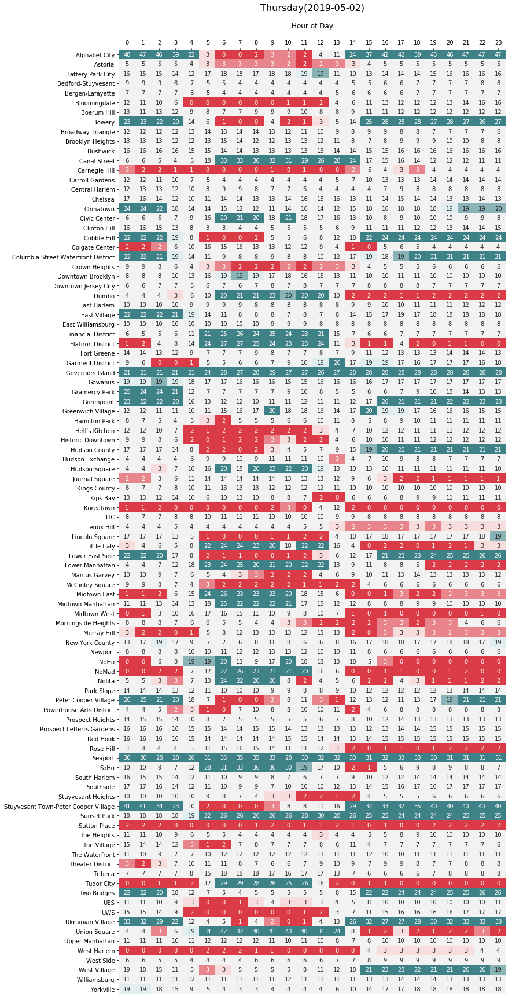

In [32]:
for day in df['month_day'].unique():
    df_temp = df[df['month_day'] == day]
    day_name = df_temp['day_name'].iloc[0]
    df_pivot = (df_temp.query('station_status == "In Service"')
            .pivot_table(values='available_bikes', index='hood', columns=['time_int'], aggfunc='mean'))
    fig, ax = plt.subplots(figsize=(12,30))
    cmap = sns.diverging_palette(10, 200, sep=225, n=40) #sep=225
    sns.heatmap(data=df_pivot, cmap=cmap, annot=True, fmt=".0f", cbar_kws={"shrink": 0.7}, cbar= False, vmin=2, vmax=20)
    ax.xaxis.tick_top() # x axis on top
    ax.xaxis.set_label_position('top')
    ax.xaxis.labelpad = 20
    plt.ylabel('')
    plt.xlabel('Hour of Day', fontsize = 12)
    plt.title(day_name + '(' + day + ')', pad=20, fontsize=16);

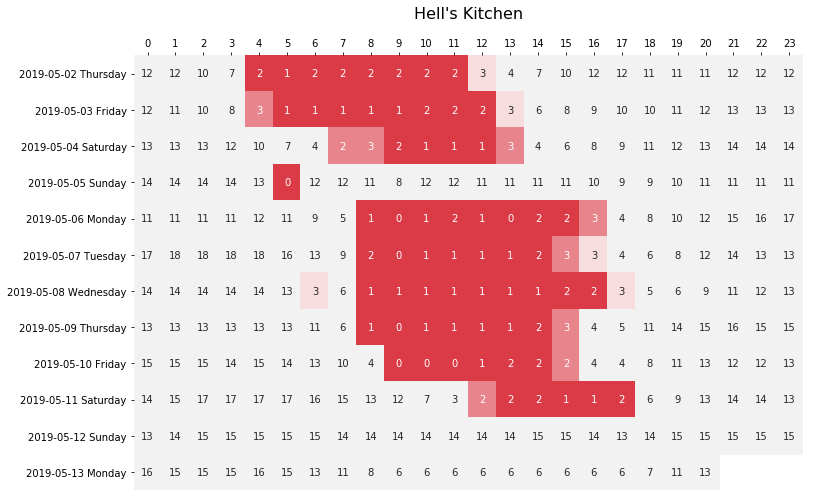

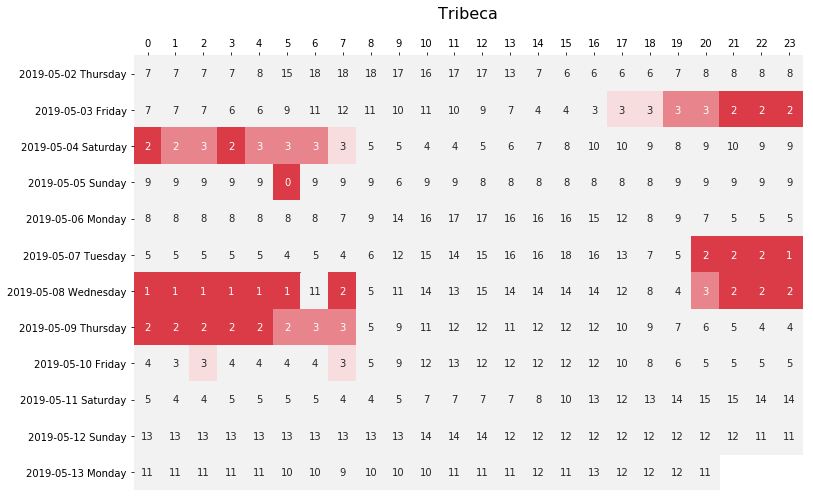

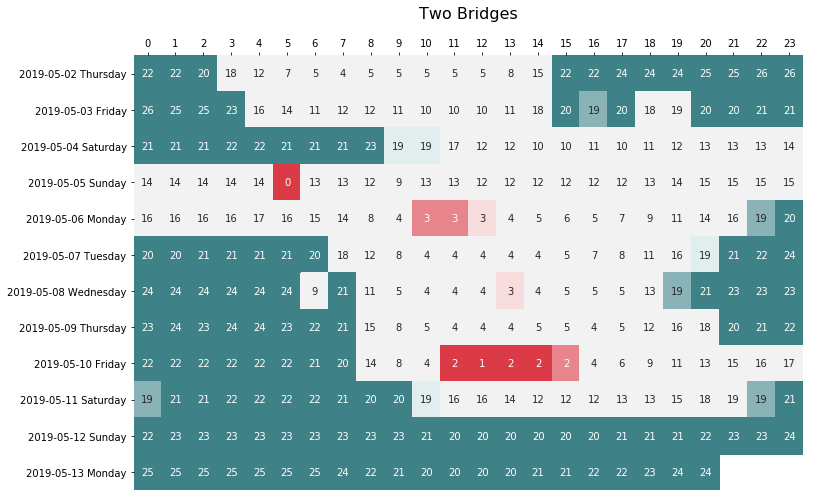

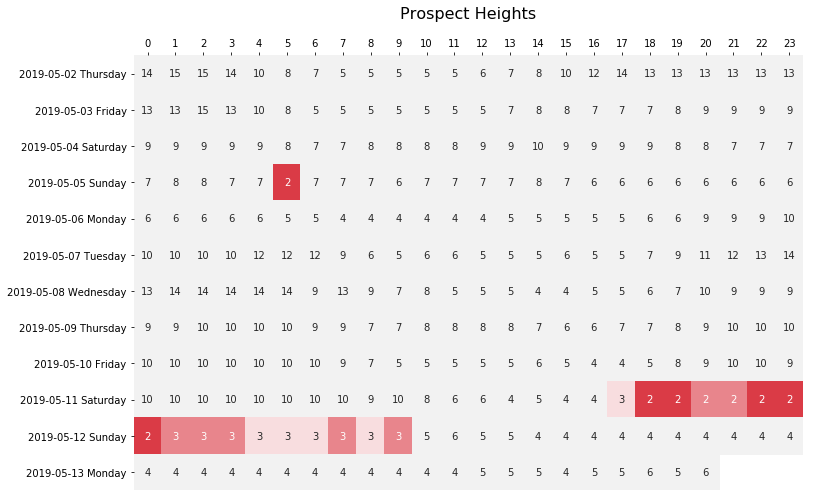

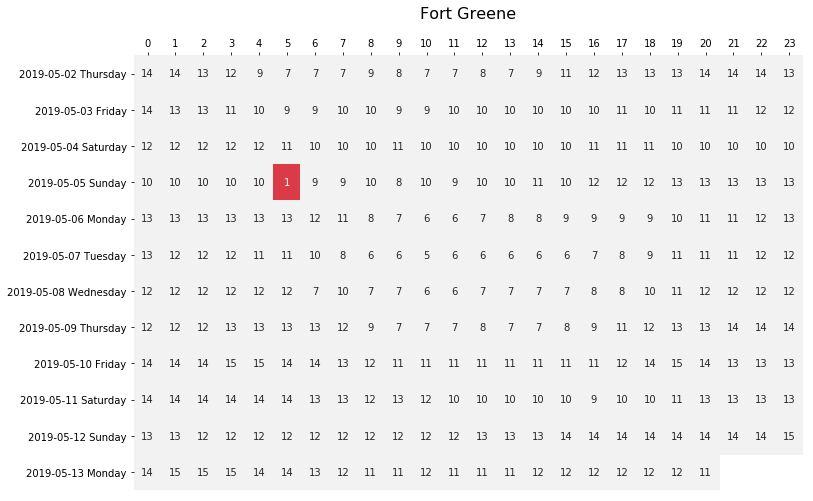

...

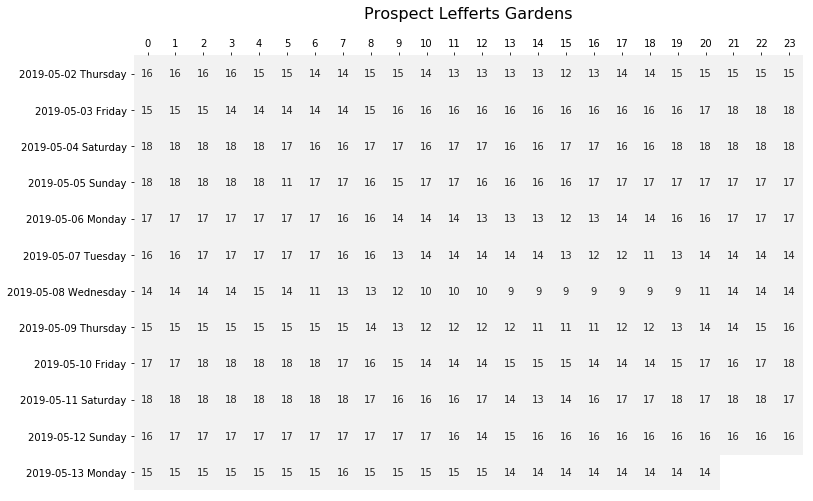

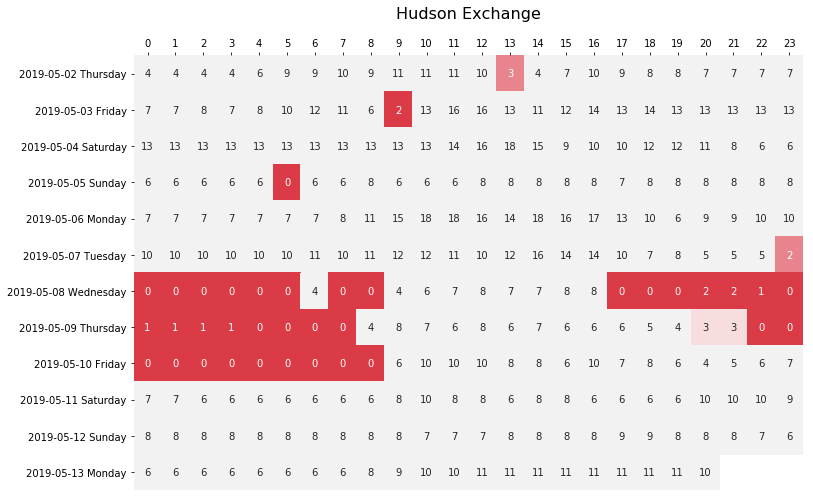

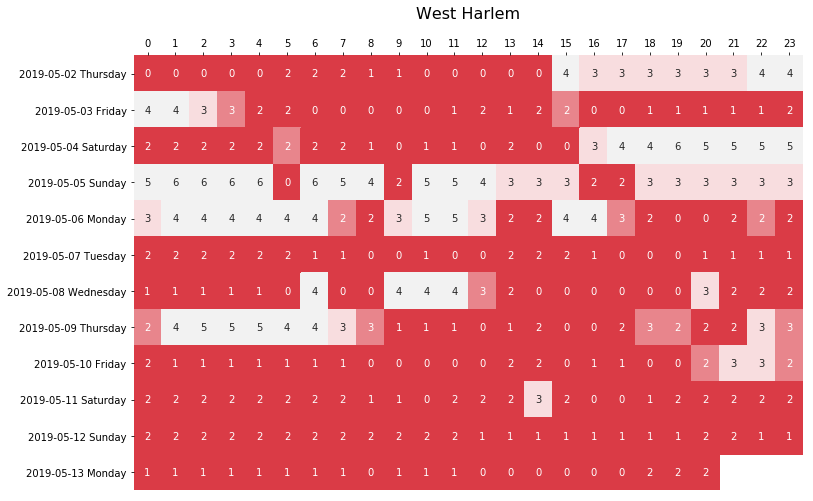

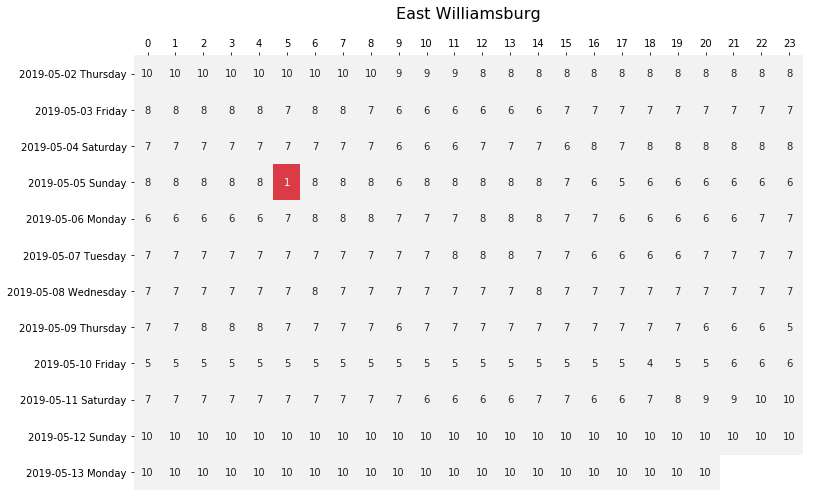

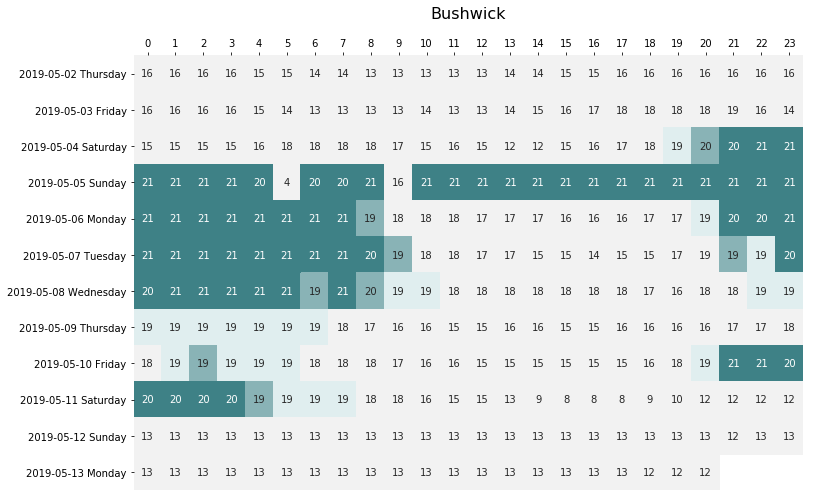

In [24]:
for hood in df['hood'].unique():
    df_temp = df[df['hood'] == hood]
    df_pivot = (df_temp.query('station_status == "In Service"')
            .pivot_table(values='available_bikes', index='month_day_name', columns=['time_int'], aggfunc='mean'))
    fig, ax = plt.subplots(figsize=(12,8))
    cmap = sns.diverging_palette(10, 200, sep=225, n=40) #sep=225
    sns.heatmap(data=df_pivot, cmap=cmap, annot=True, fmt=".0f", cbar_kws={"shrink": 0.7}, cbar= False, vmin=2, vmax=20)
    ax.xaxis.tick_top() # x axis on top
    ax.xaxis.set_label_position('top')
    ax.xaxis.labelpad = 20
    plt.ylabel('')
    plt.xlabel('', fontsize = 12)
    plt.title(hood, pad=20, fontsize=16);
  

In [26]:
df.describe()

,station_id,latitude,longitude,zip,available_bikes,available_docks,precip_intensity,temperature,humidity,wind_speed,wind_gust,cloud_cover,time_float,time_int,day,is_weekday
count,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000,945202.000000
mean,2411.750177,40.732382,-73.975241,10374.338797,10.613694,19.644767,0.011502,57.246190,0.779333,5.264363,5.982829,0.816430,11.799921,11.423925,3.266899,0.668267
std,1417.032759,0.038801,0.030949,959.303442,10.169689,13.585291,0.028493,6.915822,0.155958,2.914828,3.137243,0.291444,6.892111,6.887053,2.028614,0.470836
min,72.000000,40.655400,-74.083639,7302.000000,0.000000,0.000000,0.000000,43.130000,0.290000,0.030000,0.090000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,474.000000,40.701907,-73.993440,10014.000000,2.000000,9.000000,0.000000,52.880000,0.680000,2.960000,3.540000,0.750000,5.750000,5.000000,2.000000,0.000000
50%,3209.000000,40.728745,-73.975232,10036.000000,8.000000,18.000000,0.000000,56.240000,0.830000,5.250000,5.840000,1.000000,11.750000,11.000000,4.000000,1.000000
75%,3498.000000,40.762744,-73.952420,11206.000000,17.000000,28.000000,0.000000,61.500000,0.910000,7.330000,8.070000,1.000000,17.750000,17.000000,5.000000,1.000000
max,3781.000000,40.814394,-73.907744,11249.000000,79.000000,79.000000,0.180000,76.660000,1.000000,15.960000,24.560000,1.000000,23.750000,23.000000,6.000000,1.000000


In [72]:
df_grouped = df.groupby(['time_int', 'day_name', 'is_cold'])['available_bikes'].sum().reset_index()
df_grouped.head()

,time_int,day_name,is_cold,available_bikes
0,0,Friday,False,38149
1,0,Friday,True,40331
2,0,Monday,True,81723
3,0,Saturday,False,37629
4,0,Saturday,True,39637


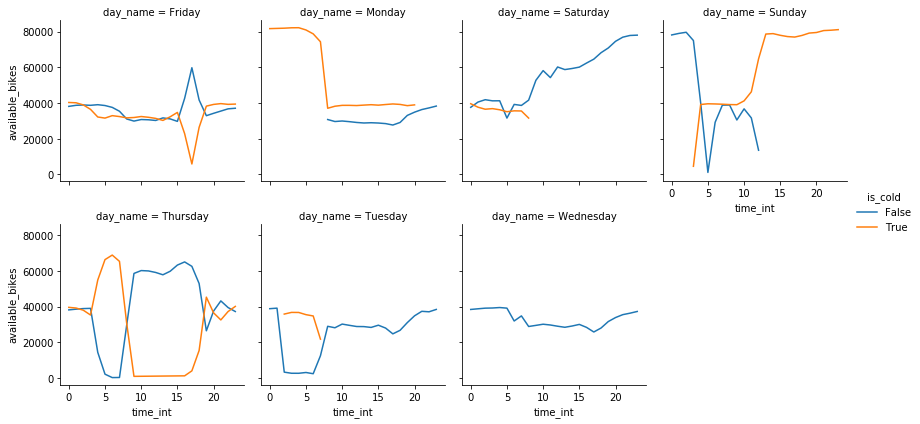

In [73]:
g = sns.FacetGrid(df_grouped, col="day_name", col_wrap=4, hue="is_cold")
g = g.map(plt.plot, "time_int", "available_bikes").add_legend()

In [55]:
df.head()

,station_id,station_name,station_status,latitude,longitude,zip,borough,hood,available_bikes,available_docks,...,cloud_cover,weather_status,updated_at,time_float,time_int,day,day_name,month_day,is_weekday,month_day_name
0,72,W 52 St & 11 Ave,In Service,40.767272,-73.993929,10019,Manhattan,Hell's Kitchen,0,53,...,1.0,observed,2019-05-12 12:04:02,9.75,9,6,Sunday,2019-05-05,0,2019-05-05 Sunday
1,72,W 52 St & 11 Ave,In Service,40.767272,-73.993929,10019,Manhattan,Hell's Kitchen,7,46,...,1.0,observed,2019-05-12 12:04:02,10.25,10,6,Sunday,2019-05-05,0,2019-05-05 Sunday
2,72,W 52 St & 11 Ave,In Service,40.767272,-73.993929,10019,Manhattan,Hell's Kitchen,7,46,...,1.0,observed,2019-05-12 12:04:02,10.50,10,6,Sunday,2019-05-05,0,2019-05-05 Sunday
3,72,W 52 St & 11 Ave,In Service,40.767272,-73.993929,10019,Manhattan,Hell's Kitchen,7,46,...,1.0,observed,2019-05-12 12:04:02,10.75,10,6,Sunday,2019-05-05,0,2019-05-05 Sunday
4,72,W 52 St & 11 Ave,In Service,40.767272,-73.993929,10019,Manhattan,Hell's Kitchen,8,45,...,1.0,observed,2019-05-12 12:04:02,11.00,11,6,Sunday,2019-05-05,0,2019-05-05 Sunday


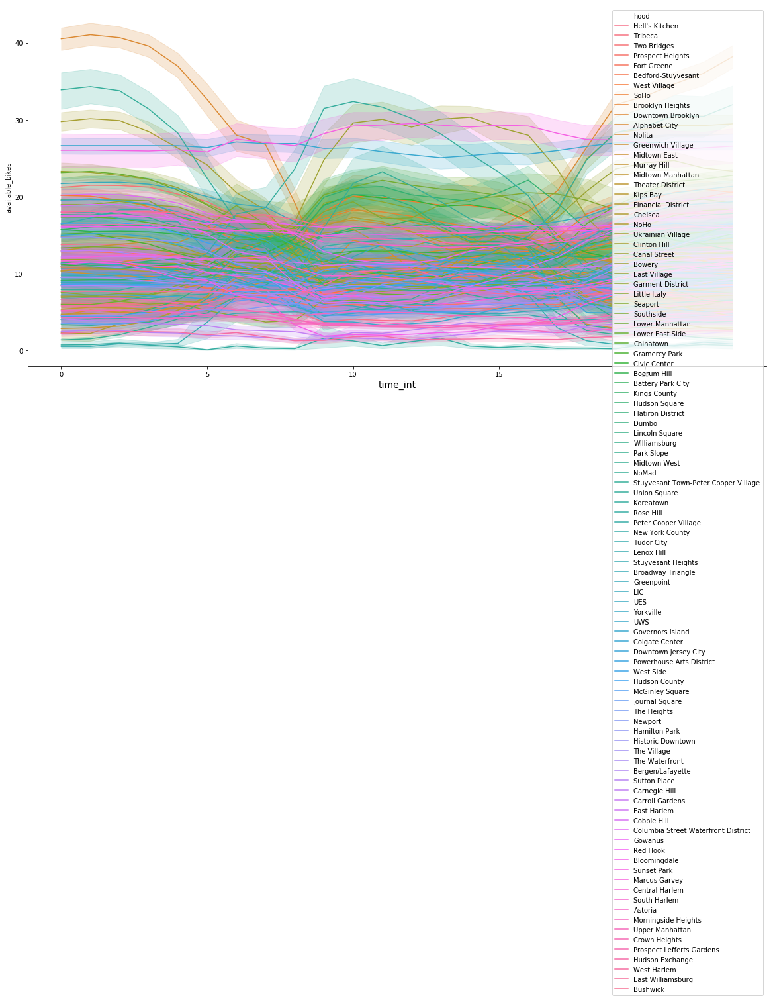

In [36]:
plt.figure(figsize=(20, 10))
plt.xlabel(xlabel='', fontsize = 14)
lp = sns.lineplot(data=df,y='available_bikes', x='time_int', hue="hood")
sns.despine()

In [78]:
df['is_raining'] = df['precip_intensity'].apply(lambda x: int(x > 0))

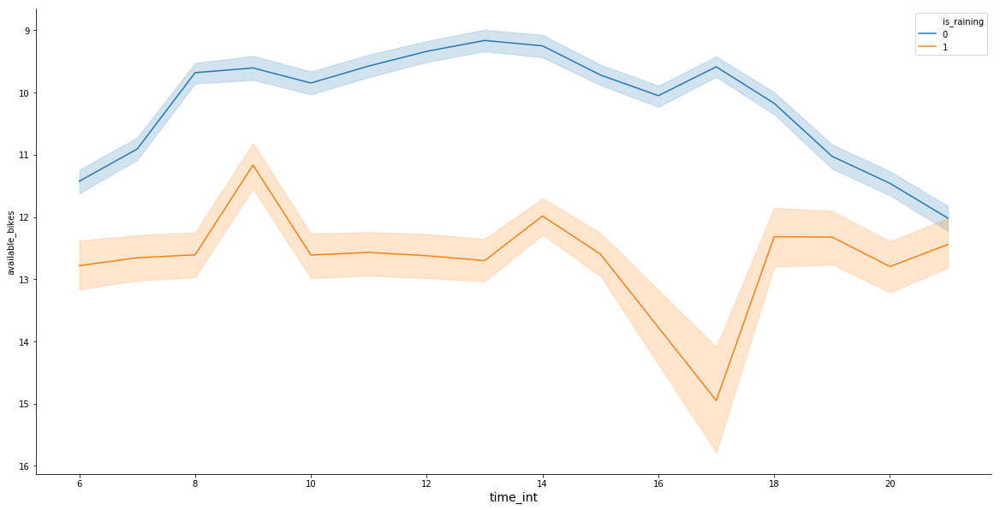

In [79]:
plt.figure(figsize=(20, 10))
plt.xlabel(xlabel='', fontsize = 14)
lp = sns.lineplot(data=df_daytime,y='available_bikes', x='time_int', hue="is_raining")
lp.invert_yaxis()
sns.despine()

In [88]:
df_vars = df.groupby(['hood', 'month_day_name'])['available_bikes'].var().reset_index().sort_values('available_bikes', ascending=False)
df_vars = df_vars.groupby('hood')['available_bikes'].mean().reset_index().sort_values('available_bikes', ascending=False)

In [91]:
df_vars

,hood,available_bikes
0,Alphabet City,360.859242
91,Union Square,258.567556
78,Stuyvesant Town-Peter Cooper Village,256.173029
74,SoHo,246.804966
90,Ukrainian Village,192.911990
57,Midtown Manhattan,184.307368
50,Lincoln Square,174.147251
15,Chelsea,162.822055
64,NoMad,156.688511
11,Canal Street,151.504054


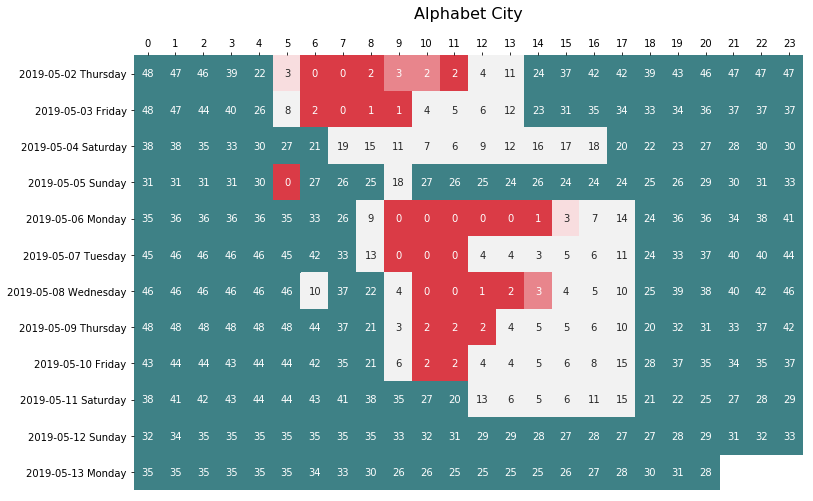

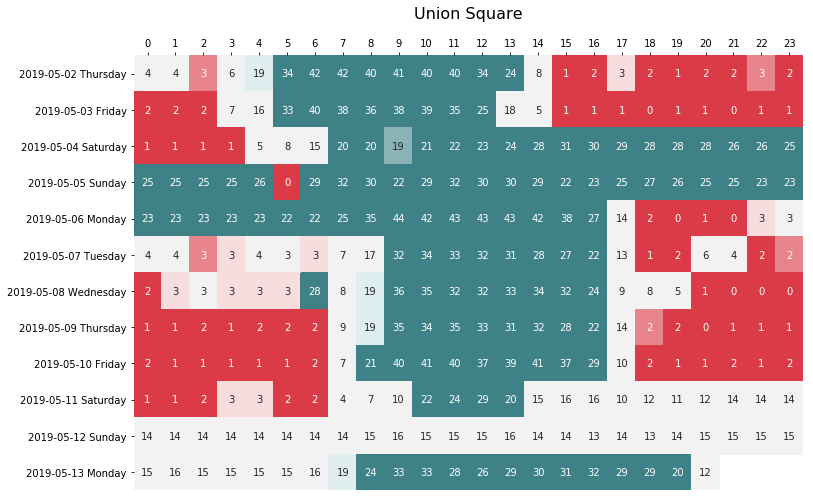

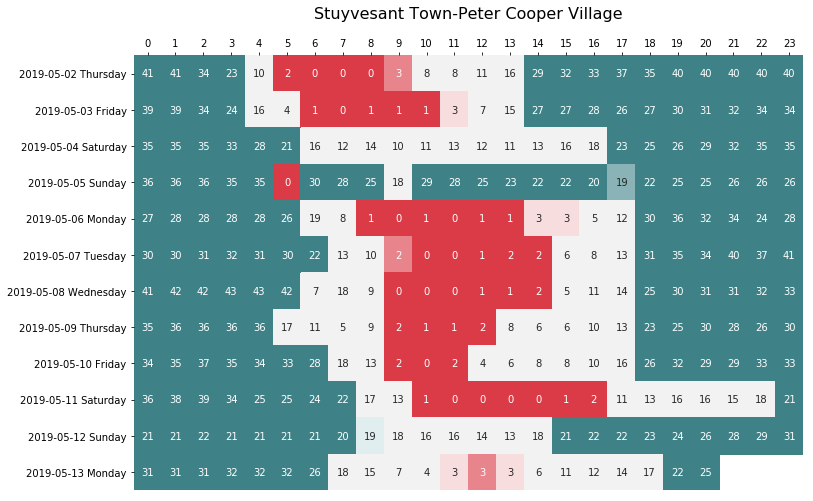

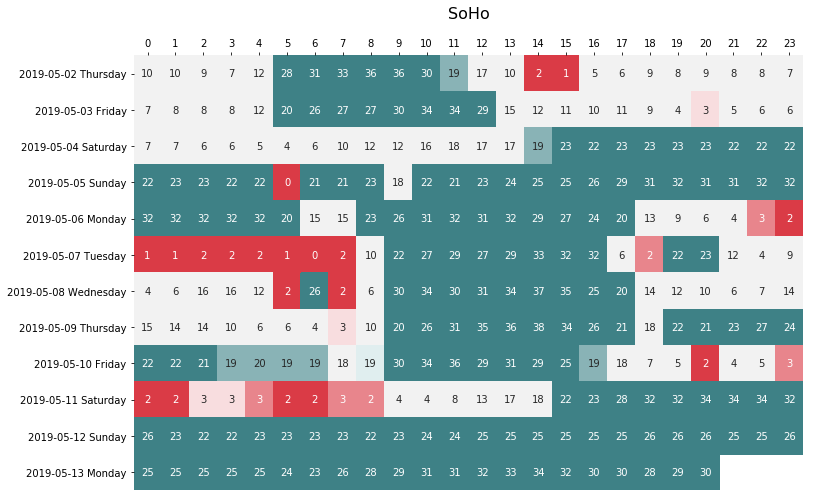

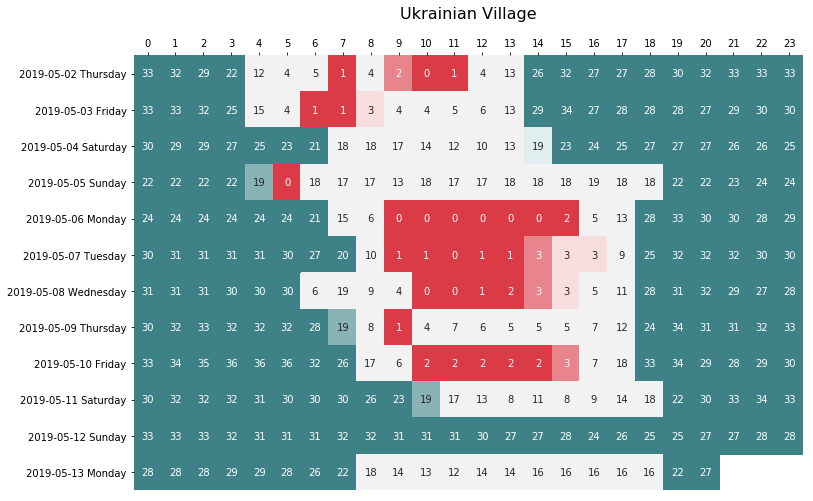

...

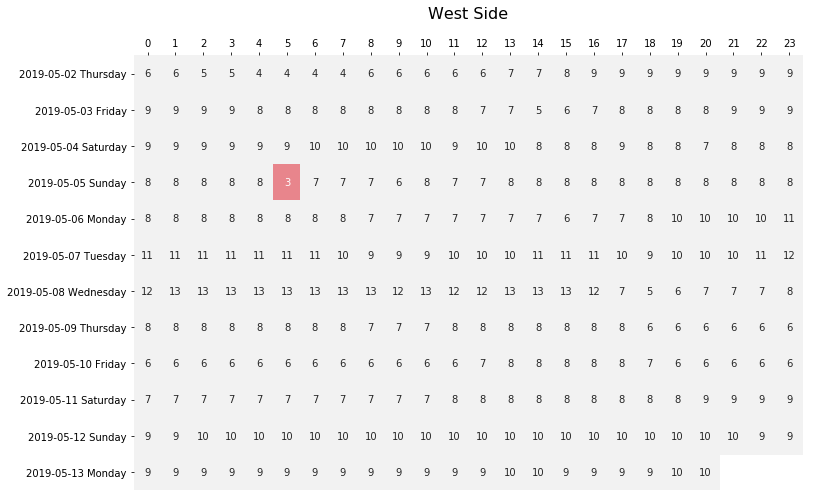

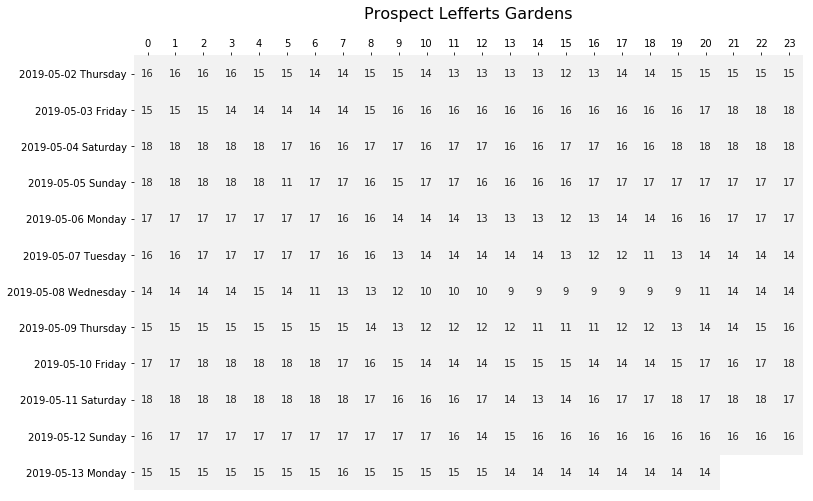

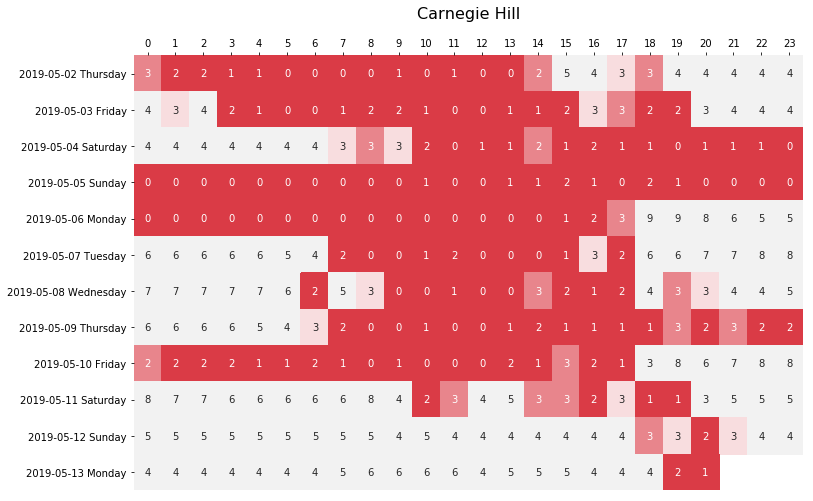

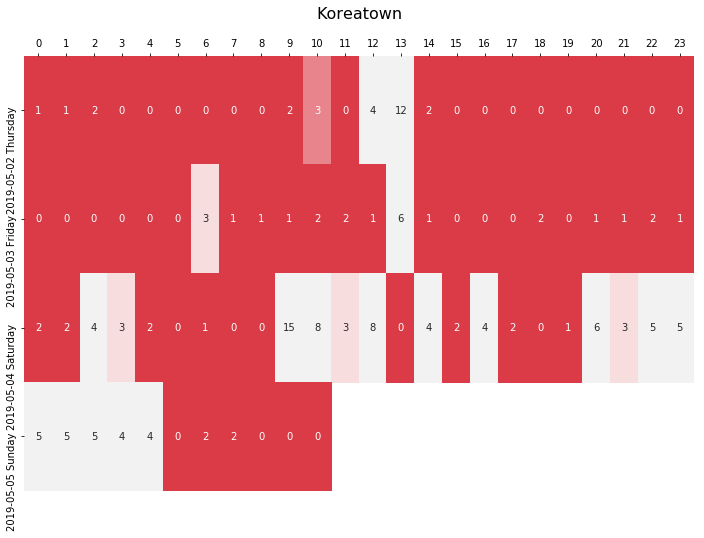

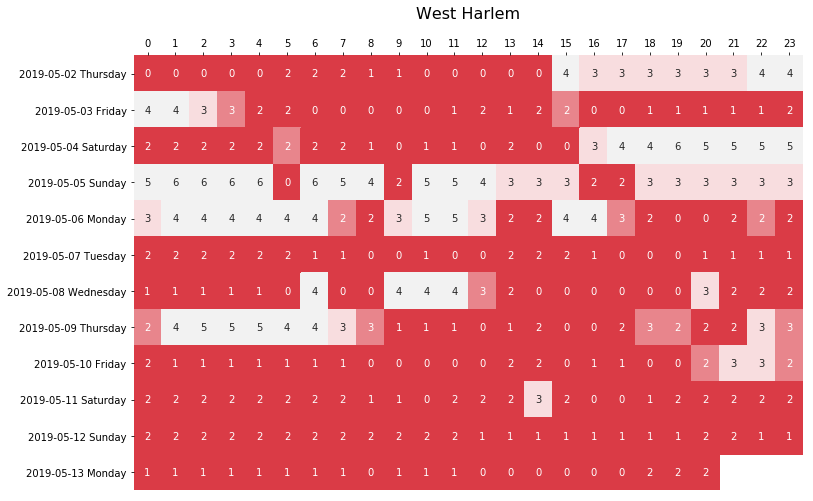

In [86]:
for hood in df_vars['hood']:
    df_temp = df[df['hood'] == hood]
    df_pivot = (df_temp.query('station_status == "In Service"')
            .pivot_table(values='available_bikes', index='month_day_name', columns=['time_int'], aggfunc='mean'))
    fig, ax = plt.subplots(figsize=(12,8))
    cmap = sns.diverging_palette(10, 200, sep=225, n=40) #sep=225
    sns.heatmap(data=df_pivot, cmap=cmap, annot=True, fmt=".0f", cbar_kws={"shrink": 0.7}, cbar= False, vmin=2, vmax=20)
    ax.xaxis.tick_top() # x axis on top
    ax.xaxis.set_label_position('top')
    ax.xaxis.labelpad = 20
    plt.ylabel('')
    plt.xlabel('', fontsize = 12)
    plt.title(hood, pad=20, fontsize=16);

In [93]:
df_by_hood_hour = df.groupby(['hood','month_day_name', 'time_int'])['available_bikes'].mean().reset_index()

In [103]:
df_count_zeros = (df_by_hood_hour[df_by_hood_hour['available_bikes'] == 0].groupby(['hood', 'month_day_name'])['available_bikes']
.count().reset_index().rename(columns={'available_bikes' : 'count_zero'}).sort_values('count_zero', ascending=False))

df_count_zeros['count_zero'] = (df_count_zeros['count_zero']/24 * 100).round()

In [107]:
# @TODO: calculate z-score instead of variance
df_vars = df.groupby(['hood', 'month_day_name'])['available_bikes'].var().reset_index().rename(columns={'available_bikes': 'variance'}).sort_values('variance', ascending=False)
df_vars.sample(5)

,hood,month_day_name,variance
4,Alphabet City,2019-05-06 Monday,382.065174
1129,West Side,2019-05-03 Friday,10.138490
1002,The Waterfront,2019-05-08 Wednesday,38.925152
294,Downtown Jersey City,2019-05-08 Wednesday,35.739389
223,Clinton Hill,2019-05-09 Thursday,65.967808


In [108]:
df_interesting = df_count_zeros.merge(df_vars, on=['hood', 'month_day_name'])

In [114]:
df_interesting.sort_values('variance', ascending=False)

,hood,month_day_name,count_zero,variance
108,Stuyvesant Town-Peter Cooper Village,2019-05-08 Wednesday,4.0,403.203058
69,NoMad,2019-05-06 Monday,8.0,306.436491
68,NoMad,2019-05-07 Tuesday,8.0,305.579407
109,Stuyvesant Town-Peter Cooper Village,2019-05-07 Tuesday,4.0,294.926636
29,NoMad,2019-05-08 Wednesday,25.0,283.507417
97,Union Square,2019-05-08 Wednesday,4.0,267.773471
34,Canal Street,2019-05-07 Tuesday,21.0,265.690789
107,Stuyvesant Town-Peter Cooper Village,2019-05-11 Saturday,4.0,244.828970
142,Canal Street,2019-05-08 Wednesday,4.0,239.139364
155,NoMad,2019-05-09 Thursday,4.0,236.883481


In [112]:
df_interesting[(df_interesting['count_zero'] > 30) & (df_interesting['variance'] > 30)]

,hood,month_day_name,count_zero,variance
0,Koreatown,2019-05-07 Tuesday,100.0,0.000000
1,Koreatown,2019-05-12 Sunday,100.0,0.000000
2,Koreatown,2019-05-11 Saturday,100.0,0.000000
3,Koreatown,2019-05-10 Friday,100.0,0.000000
4,Koreatown,2019-05-09 Thursday,100.0,0.000000
5,Koreatown,2019-05-08 Wednesday,100.0,0.000000
6,Koreatown,2019-05-06 Monday,96.0,0.010417
7,Koreatown,2019-05-13 Monday,88.0,0.000000
8,Tudor City,2019-05-07 Tuesday,50.0,86.144627
9,Tudor City,2019-05-11 Saturday,50.0,0.449328


In [116]:
df.sample(10)

,station_id,station_name,station_status,latitude,longitude,zip,borough,hood,available_bikes,available_docks,...,updated_at,time_float,time_int,day,day_name,month_day,is_weekday,month_day_name,is_raining,is_cold
588199,3348,Coffey St & Conover St,In Service,40.677236,-74.015665,11231,Brooklyn,Red Hook,17,2,...,2019-05-12 12:04:02,18.75,18,1,Tuesday,2019-05-07,1,2019-05-07 Tuesday,False,False
398939,3129,Queens Plaza North & Crescent St,In Service,40.751102,-73.940737,11101,Queens,LIC,6,24,...,2019-05-12 12:47:25,18.00,18,4,Friday,2019-05-03,1,2019-05-03 Friday,False,True
681977,3454,Leonard St & Maujer St,In Service,40.710369,-73.947060,11206,Brooklyn,Southside,5,19,...,2019-05-12 12:04:02,19.00,19,0,Monday,2019-05-06,1,2019-05-06 Monday,False,False
332443,3056,Kosciuszko St & Nostrand Ave,In Service,40.690725,-73.951335,11216,Brooklyn,Bedford-Stuyvesant,3,18,...,2019-05-12 12:04:02,5.25,5,0,Monday,2019-05-06,1,2019-05-06 Monday,False,True
926638,3758,George St & Wilson Ave,In Service,40.702997,-73.929970,11206,Brooklyn,Bushwick,16,3,...,2019-05-11 16:43:45,14.25,14,4,Friday,2019-05-10,1,2019-05-10 Friday,True,False
524965,3288,E 88 St & 1 Ave,In Service,40.778301,-73.948813,10128,Manhattan,Yorkville,25,12,...,2019-05-12 13:24:27,20.25,20,2,Wednesday,2019-05-08,1,2019-05-08 Wednesday,False,False
228097,467,Dean St & 4 Ave,In Service,40.683125,-73.978951,11217,Brooklyn,Park Slope,4,27,...,2019-05-12 12:47:25,2.75,2,4,Friday,2019-05-03,1,2019-05-03 Friday,False,True
883697,3687,E 33 St & 1 Ave,In Service,40.743227,-73.974498,10016,Manhattan,Kips Bay,4,50,...,2019-05-12 12:04:02,23.50,23,4,Friday,2019-05-10,1,2019-05-10 Friday,False,False
94365,313,Washington Ave & Park Ave,In Service,40.696102,-73.967510,11205,Brooklyn,Clinton Hill,6,16,...,2019-05-12 12:04:02,3.25,3,6,Sunday,2019-05-12,0,2019-05-12 Sunday,True,False
761843,3546,Pacific St & Classon Ave,In Service,40.679194,-73.958790,11238,Brooklyn,Crown Heights,0,19,...,2019-05-12 12:51:56,5.25,5,3,Thursday,2019-05-02,1,2019-05-02 Thursday,False,True
